In [1]:
# Capstone

In [3]:
# 1.- Data cleaning
# 2.- Data Preprocessing
# 3.- EDA (Exploratory Data Analysis)
# 4.- Feature Engineering and Feature Selection
# 5 - Modeling
# 6 - Performance Evaluation
# 7 - Optimization

In [5]:
#importing libraries needed
import pandas as pd
import numpy as np
import sys 
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn import metrics


from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from collections import Counter


from warnings import filterwarnings
filterwarnings('ignore')

In [6]:

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None) 
# pd.set_option('display.width', None)  

train=pd.read_csv(r"C:\Users\susan\OneDrive\Рабочий стол\dsa\capstonePython\train.csv")
test=pd.read_csv(r"C:\Users\susan\OneDrive\Рабочий стол\dsa\capstonePython\test.csv")

print('train shape:',train.shape, 'test shape:', test.shape)

train shape: (3865, 80) test shape: (890, 79)


In [7]:
# Start with this  tasks
# 1.- Data cleaning
# 2.- Data Preprocessing
# 3.- EDA (Exploratory Data Analysis)
# 4.- Feature Engineering and Feature Selection
# After data will be ready then start modeling


In [8]:
# Get familiar with target 'y' and other columns, look at values, distributin, nulls, type ...

In [13]:
train['y'].value_counts()

y
0.052590    1
0.070430    1
0.094714    1
0.049754    1
0.066103    1
           ..
0.048667    1
0.058389    1
0.162859    1
0.196922    1
0.100069    1
Name: count, Length: 3865, dtype: int64

In [15]:
train['y'].isna().sum()

0

Text(0.5, 1.0, 'Target Distribution')

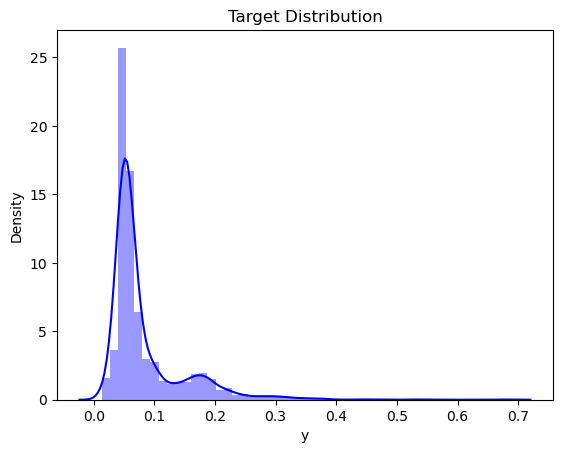

In [17]:
sns.distplot(train['y'], color= 'b',label='train')
plt.title('Target Distribution')

In [18]:
train['y'].min(), train['y'].max()

(0.0130364517665869, 0.6838126553011508)

In [21]:
# make 7 bins  to see how much observations are in this y in (0-0,1) interval
bins = pd.cut(train['y'], bins=7)

bin_counts = bins.value_counts().sort_index()

print(bin_counts)

y
(0.0124, 0.109]    3121
(0.109, 0.205]      531
(0.205, 0.301]      158
(0.301, 0.396]       44
(0.396, 0.492]        6
(0.492, 0.588]        3
(0.588, 0.684]        2
Name: count, dtype: int64


In [23]:
# almost all y values between (0.0124, 0.109]
# so target columns in continuos variable -> regression problem

In [25]:
# Data cleaning

In [27]:
# missing values, outliers, duplicates

In [29]:
df = pd.concat([train, test], ignore_index=True)
df_copy=df
df.head()

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,...,"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,990025,Large Magellanic Cloud (LMC),0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052590
1,990025,Camelopardalis B,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,0.467873,...,NaN,NaN,NaN,NaN,NaN,19.177926,NaN,22.785018,NaN,0.059868
2,990025,Virgo I,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,0.363837,...,NaN,NaN,NaN,NaN,NaN,21.151265,6.534020,NaN,NaN,0.050449
3,990025,UGC 8651 (DDO 181),0.555862,52.333293,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.912194,NaN,NaN,0.049394
4,990025,Tucana Dwarf,0.991196,81.802464,81033.956906,1.131163,13.800672,13.188907,0.910341,0.918353,...,NaN,NaN,NaN,NaN,NaN,NaN,5.611753,NaN,NaN,0.154247


In [31]:
df.duplicated().sum() # there were no any duplicates

0

In [33]:
df.size

380400

In [35]:
df.isnull().sum().sum()

206422

In [37]:
df.isnull().sum().sum()/df.size    # woooow, 54% of data is missings, bad

0.5426445846477392

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4755 entries, 0 to 4754
Data columns (total 80 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   galactic year                                                                            4755 non-null   int64  
 1   galaxy                                                                                   4755 non-null   object 
 2   existence expectancy index                                                               4749 non-null   float64
 3   existence expectancy at birth                                                            4749 non-null   float64
 4   Gross income per capita                                                                  4722 non-null   float64
 5   Income Index                                                  

Train missing values: 185698
Test missing values: 19834


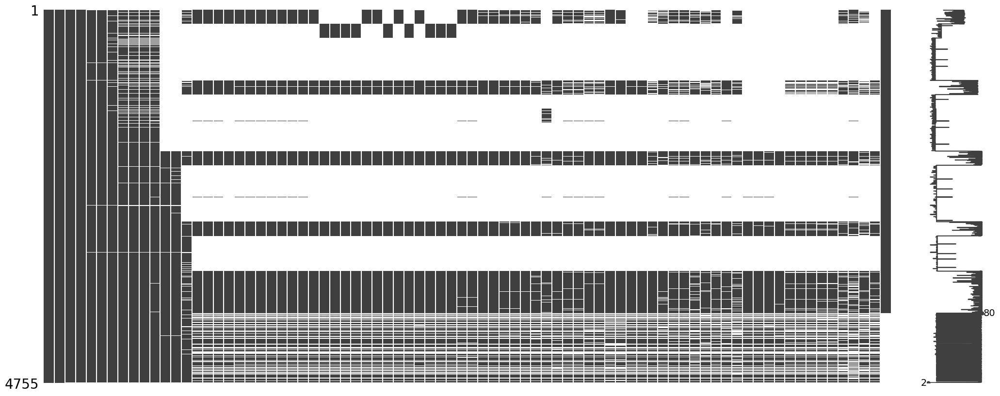

In [41]:
# using msno for visualize all missings
import missingno as msno 
msno.matrix(df)
print('Train missing values:', train.isnull().sum().sum())
print('Test missing values:', test.isna().sum().sum())

In [43]:
#  find percentage of missing values in each column
missing_info = pd.DataFrame({
    'Column': df.columns,
    'Missing Percentage': (df.isna().mean() * 100)
})

# sort in descending order, to define in which columns there are the more missings
missing_info = missing_info.sort_values(by='Missing Percentage', ascending=False).reset_index(drop=True)

print(missing_info)

                                               Column  Missing Percentage
0                       Gender Inequality Index (GII)           71.125131
1             Private galaxy capital flows (% of GGP)           70.347003
2   Creature Immunodeficiency Disease prevalence, ...           70.073607
3                               Adjusted net savings            69.905363
4   Intergalactic Development Index (IDI), male, Rank           69.695058
..                                                ...                 ...
75                            Gross income per capita            0.694006
76                      existence expectancy at birth            0.126183
77                         existence expectancy index            0.126183
78                                             galaxy            0.000000
79                                      galactic year            0.000000

[80 rows x 2 columns]


In [45]:
# these are columns in which missing values more than 30%, usually such kind of columns are not useful in modelling
# 68 columns in dataset have more than 30% missing values
print(df.loc[:, df.isna().mean() * 100 > 30].columns)
print(df.loc[:, df.isna().mean() * 100 > 30].shape)

Index(['Population using at least basic drinking-water services (%)',
       'Population using at least basic sanitation services (%)',
       'Gross capital formation (% of GGP)', 'Population, total (millions)',
       'Population, urban (%)',
       'Mortality rate, under-five (per 1,000 live births)',
       'Mortality rate, infant (per 1,000 live births)',
       'Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))',
       'Population, ages 15–64 (millions)',
       'Population, ages 65 and older (millions)',
       'Life expectancy at birth, male (galactic years)',
       'Life expectancy at birth, female (galactic years)',
       'Population, under age 5 (millions)',
       'Young age (0-14) dependency ratio (per 100 creatures ages 15-64)',
       'Adolescent birth rate (births per 1,000 female creatures ages 15-19)',
       'Total unemployment rate (female to male ratio)',
       'Vulnerable employment (% of total employment)',
       'Unemployment,

In [47]:
# 68 from 80, thats too much, so may be try interpolate( firstly use method='linaer', but that didn't work, so now try polynomial method='spline')

In [49]:
columns_to_interpolate = df.select_dtypes(include=['number']).columns.drop('y')

In [51]:
for column in columns_to_interpolate:
    df[f'{column}_Spline'] = df[column].interpolate(method='spline', order=2)


In [52]:
df.iloc[:, 80:].isna().sum().sum() 

19873

In [53]:
# 19873 much more better than 206422 misinngs, like it was first

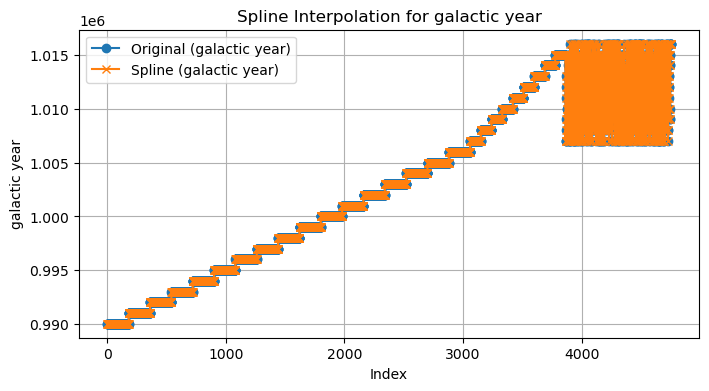

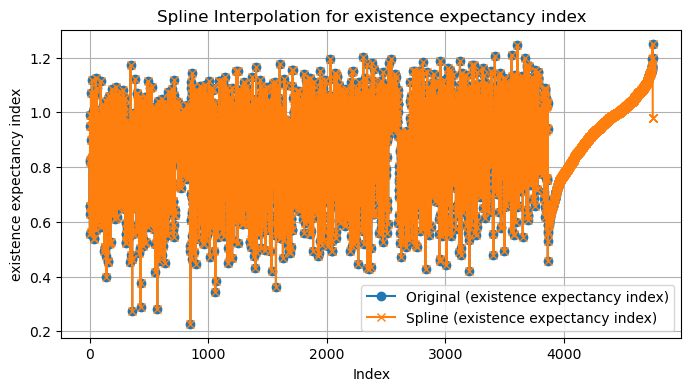

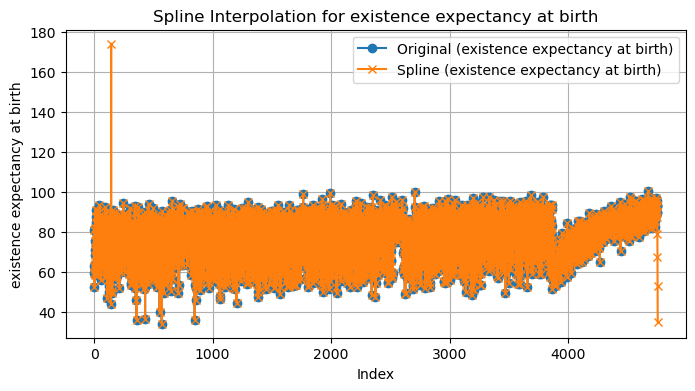

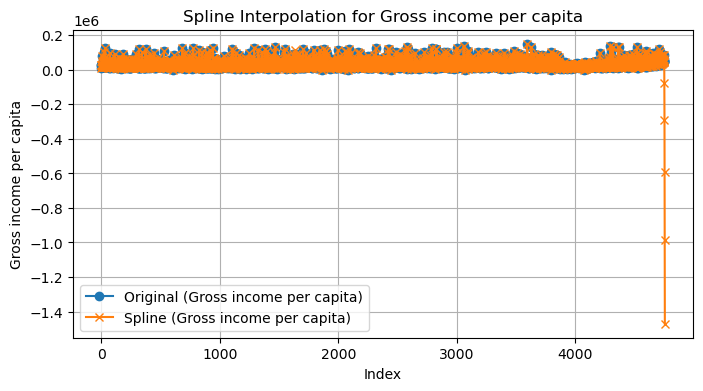

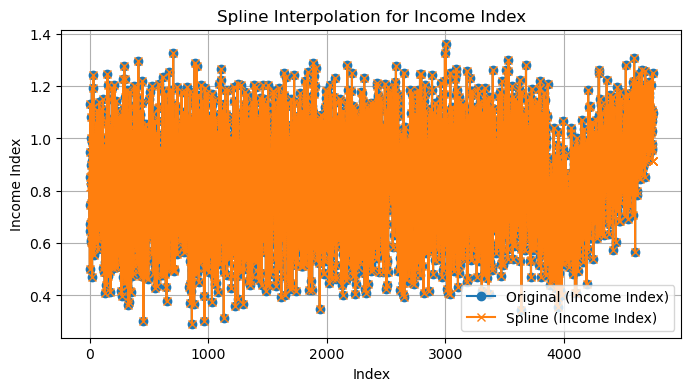

...

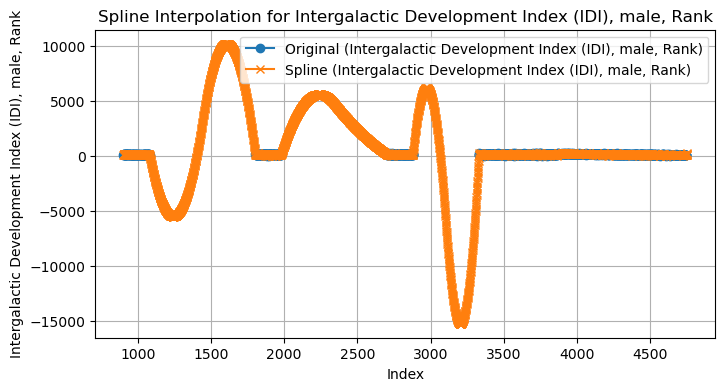

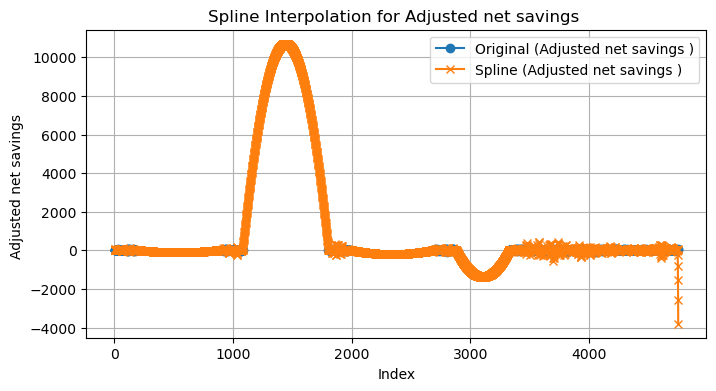

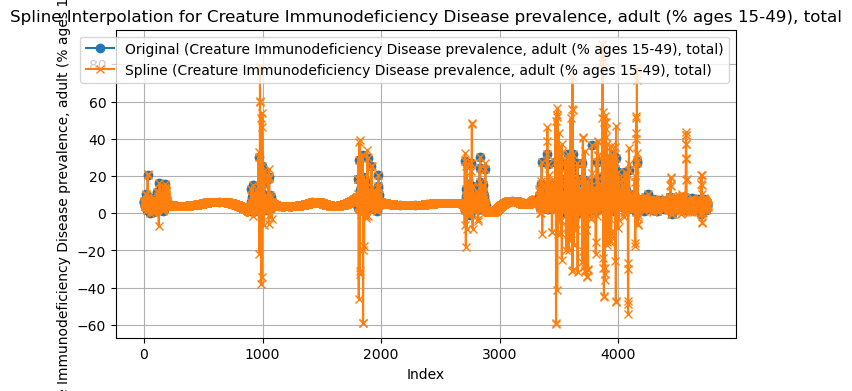

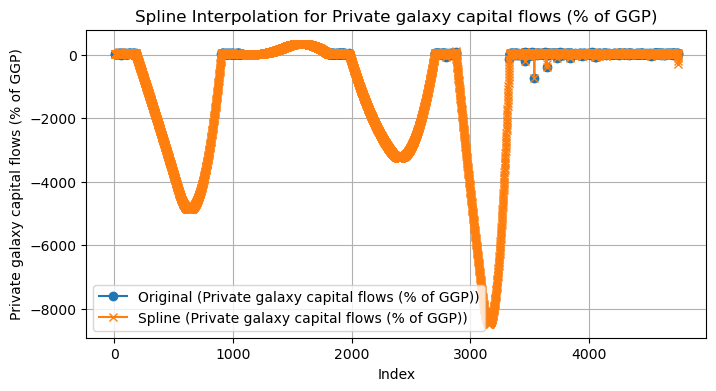

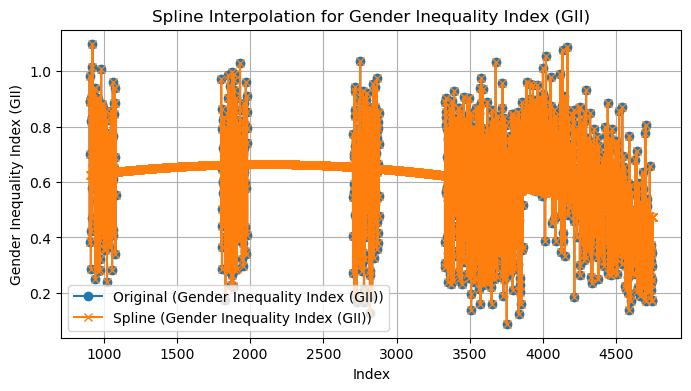

In [57]:

# Visualization of spline interpolation
for column in columns_to_interpolate:
    plt.figure(figsize=(8, 4))  # graph size
    plt.plot(df.index, df[column], 'o-', label=f'Original ({column})')  # our data
    plt.plot(df.index, df[f'{column}_Spline'], 'x-', label=f'Spline ({column})')  # data that were interpolated
    plt.title(f"Spline Interpolation for {column}")
    plt.xlabel("Index")
    plt.ylabel(column)
    plt.legend()
    plt.grid(True)  # Сетка для удобства
    plt.show()

<Axes: >

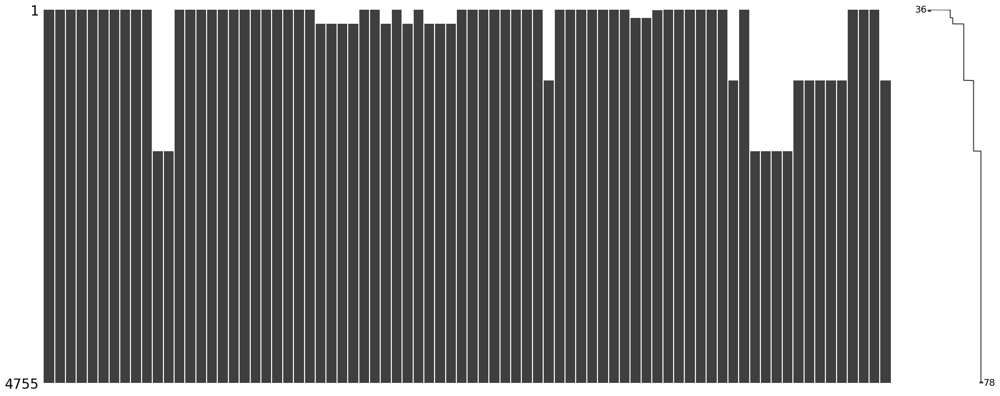

In [58]:
# after interpolation msno plot change
import missingno as msno 
msno.matrix(df.iloc[:, 80:])

In [61]:
# lets look again  in which columns there are  missings and how much
missing_info = pd.DataFrame({
    'Column': df.iloc[:, 80:].columns,
    'Missing Percentage': (df.iloc[:, 80:].isna().mean() * 100)
})

# sort in descending order, to define in which columns there are the more missings
missing_info = missing_info.sort_values(by='Missing Percentage', ascending=False).reset_index(drop=True)

print(missing_info)

                                               Column  Missing Percentage
0   Population using at least basic drinking-water...            37.87592
1   Respiratory disease incidence (per 100,000 peo...            37.87592
2   Interstellar phone subscriptions (per 100 peop...            37.87592
3   Interstellar Data Net users, total (% of popul...            37.87592
4        Current health expenditure (% of GGP)_Spline            37.87592
..                                                ...                 ...
73  Infants lacking immunization, red hot disease ...             0.00000
74  Infants lacking immunization, Combination Vacc...             0.00000
75     Gross galactic product (GGP) per capita_Spline             0.00000
76         Gross galactic product (GGP), total_Spline             0.00000
77  Mortality rate, male grown up (per 1,000 peopl...             0.00000

[78 rows x 2 columns]


In [63]:
print(df.iloc[:, 80:].loc[:, df.iloc[:, 80:].isna().mean() * 100 > 30].columns)
print(df.iloc[:, 80:].loc[:, df.iloc[:, 80:].isna().mean() * 100 > 30].shape)

Index(['Population using at least basic drinking-water services (%)_Spline',
       'Population using at least basic sanitation services (%)_Spline',
       'Respiratory disease incidence (per 100,000 people)_Spline',
       'Interstellar phone subscriptions (per 100 people)_Spline',
       'Interstellar Data Net users, total (% of population)_Spline',
       'Current health expenditure (% of GGP)_Spline'],
      dtype='object')
(4755, 6)


In [65]:
# there are 6 columns with missings more than 30%

In [67]:
# after interpolation there are new columns with filling missings, they have _Spline in names, choose this columns for further work
columns_to_select = ['galaxy'] + list(df.columns[79:])
df_spline = df[columns_to_select]
#df_spline=df.iloc[:, 79:]
df_spline.head()

,galaxy,y,galactic year_Spline,existence expectancy index_Spline,existence expectancy at birth_Spline,Gross income per capita_Spline,Income Index_Spline,Expected years of education (galactic years)_Spline,Mean years of education (galactic years)_Spline,Intergalactic Development Index (IDI)_Spline,...,Current health expenditure (% of GGP)_Spline,"Intergalactic Development Index (IDI), female_Spline","Intergalactic Development Index (IDI), male_Spline",Gender Development Index (GDI)_Spline,"Intergalactic Development Index (IDI), female, Rank_Spline","Intergalactic Development Index (IDI), male, Rank_Spline",Adjusted net savings _Spline,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total_Spline",Private galaxy capital flows (% of GGP)_Spline,Gender Inequality Index (GII)_Spline
0,Large Magellanic Cloud (LMC),0.052590,990025,0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Camelopardalis B,0.059868,990025,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,...,NaN,NaN,NaN,NaN,NaN,NaN,19.177926,NaN,22.785018,NaN
2,Virgo I,0.050449,990025,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,...,NaN,NaN,NaN,NaN,NaN,NaN,21.151265,6.534020,21.547166,NaN
3,UGC 8651 (DDO 181),0.049394,990025,0.555862,52.333293,51436.346771,0.815230,10.573588,8.827010,0.772597,...,NaN,NaN,NaN,NaN,NaN,NaN,59.541965,5.912194,20.839275,NaN
4,Tucana Dwarf,0.154247,990025,0.991196,81.802464,81033.956906,1.131163,13.800672,13.188907,0.910341,...,NaN,NaN,NaN,NaN,NaN,NaN,65.864174,5.611753,20.661267,NaN


In [69]:
df_spline.shape

(4755, 80)

In [71]:
# columns with missing
columns_with_missing = ['Population using at least basic drinking-water services (%)_Spline',
       'Population using at least basic sanitation services (%)_Spline',
       'Respiratory disease incidence (per 100,000 people)_Spline',
       'Interstellar phone subscriptions (per 100 people)_Spline',
       'Interstellar Data Net users, total (% of population)_Spline',
       'Current health expenditure (% of GGP)_Spline']  

# correlation with 'y'
correlation_with_y = df[columns_with_missing + ['y']].corr()['y']

print(correlation_with_y)


Population using at least basic drinking-water services (%)_Spline    0.423466
Population using at least basic sanitation services (%)_Spline        0.467320
Respiratory disease incidence (per 100,000 people)_Spline            -0.025546
Interstellar phone subscriptions (per 100 people)_Spline              0.002939
Interstellar Data Net users, total (% of population)_Spline           0.061678
Current health expenditure (% of GGP)_Spline                          0.002152
y                                                                     1.000000
Name: y, dtype: float64


In [73]:
# correlations is less than 0,65 => decide to drop this columns

In [75]:
data=df_spline.drop(['Population using at least basic drinking-water services (%)_Spline',
       'Population using at least basic sanitation services (%)_Spline',
       'Respiratory disease incidence (per 100,000 people)_Spline',
       'Interstellar phone subscriptions (per 100 people)_Spline',
       'Interstellar Data Net users, total (% of population)_Spline',
       'Current health expenditure (% of GGP)_Spline'],axis=1)

In [77]:
data.shape

(4755, 74)

<Axes: >

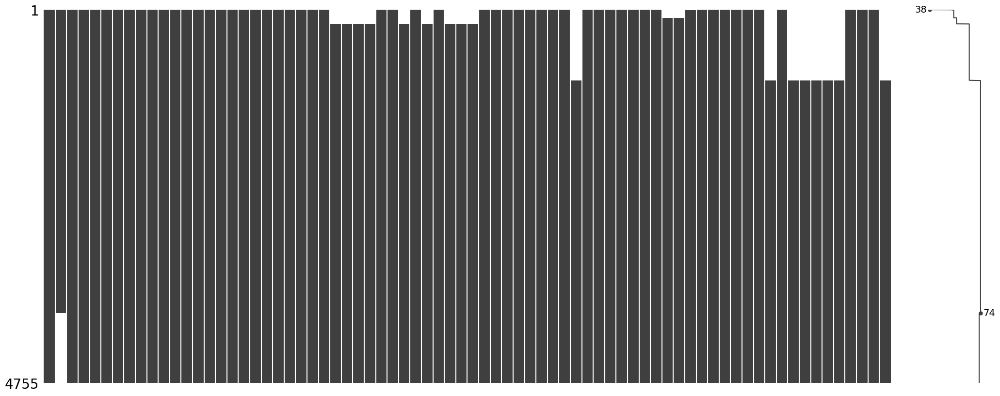

In [79]:
# check missings again and see that data is definitely more clear than it was 
msno.matrix(data)

In [81]:
# check again in percentages, its more comfy for me to understand
missing_info = pd.DataFrame({
    'Column': data.columns,
    'Missing Percentage': (data.isna().mean() * 100)
})

# sort in descending order, to define in which columns there are the more missings
missing_info = missing_info.sort_values(by='Missing Percentage', ascending=False).reset_index(drop=True)

print(missing_info)

                                               Column  Missing Percentage
0                Gender Inequality Index (GII)_Spline           18.969506
1   Intergalactic inbound tourists (thousands)_Spline           18.969506
2   Share of seats in senate (% held by female)_Sp...           18.969506
3   Intergalactic Development Index (IDI), female,...           18.948475
4               Gender Development Index (GDI)_Spline           18.948475
..                                                ...                 ...
69     Gross galactic product (GGP) per capita_Spline            0.000000
70         Gross galactic product (GGP), total_Spline            0.000000
71  Outer Galaxies direct investment, net inflows ...            0.000000
72              Exports and imports (% of GGP)_Spline            0.000000
73                                             galaxy            0.000000

[74 rows x 2 columns]


In [83]:
# Count the number of columns with a missing value percentage greater than 0
num_columns_with_missing = (missing_info['Missing Percentage'] > 0).sum()
num_columns_with_missing 

37

In [85]:
# Define this 37 columns (ecxept 'y' и 'galaxy') and fill with mean 
columns_to_fill = [col for col in data.columns if col not in ['y', 'galaxy']]

data[columns_to_fill] = data[columns_to_fill].fillna(data[columns_to_fill].mean())

print(data.isnull().sum())



galaxy                                                                                0
y                                                                                   890
galactic year_Spline                                                                  0
existence expectancy index_Spline                                                     0
existence expectancy at birth_Spline                                                  0
                                                                                   ... 
Intergalactic Development Index (IDI), male, Rank_Spline                              0
Adjusted net savings _Spline                                                          0
Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total_Spline      0
Private galaxy capital flows (% of GGP)_Spline                                        0
Gender Inequality Index (GII)_Spline                                                  0
Length: 74, dtype: int64


In [87]:
# all missing were filled. No can work with outliers,

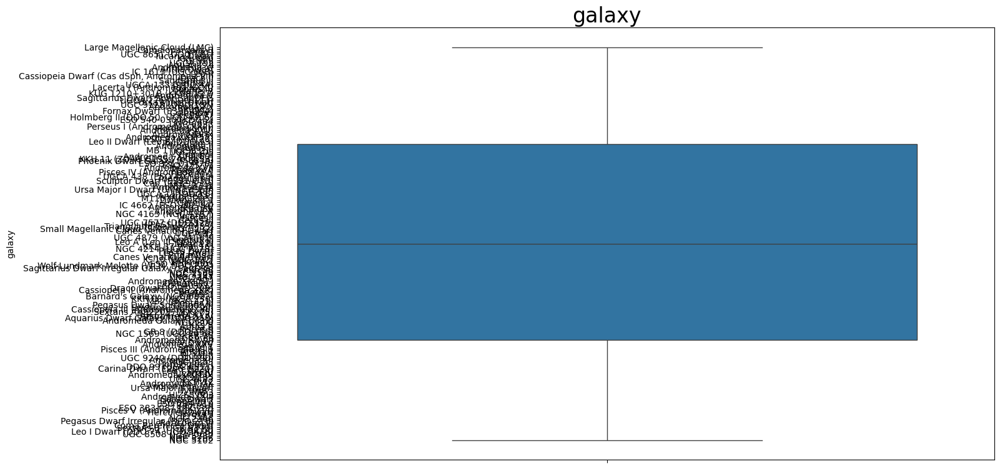

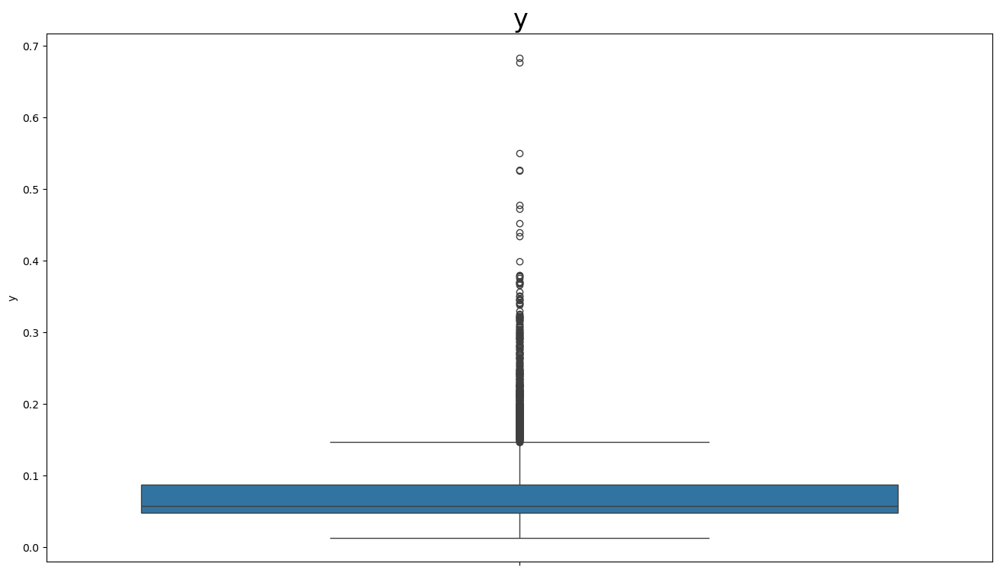

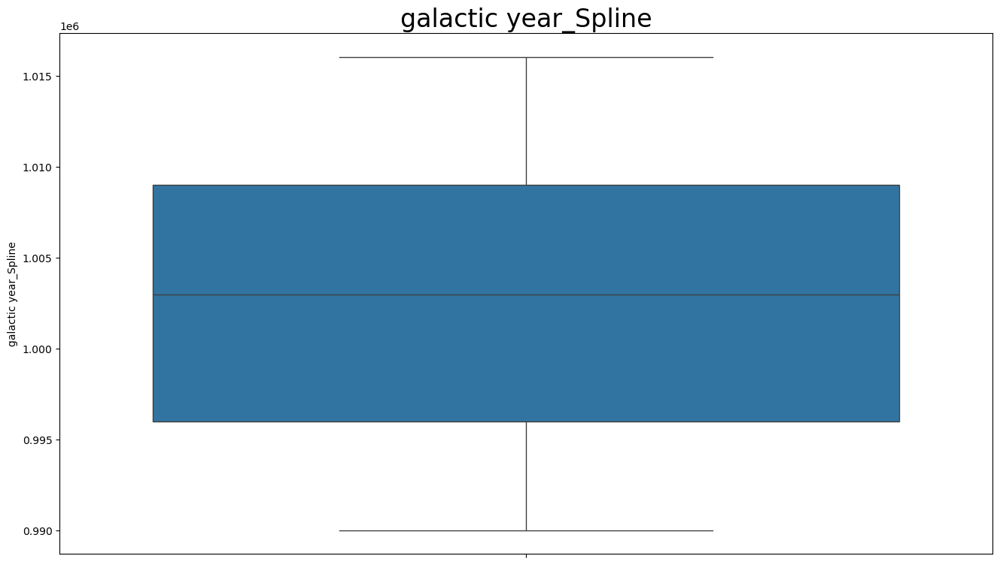

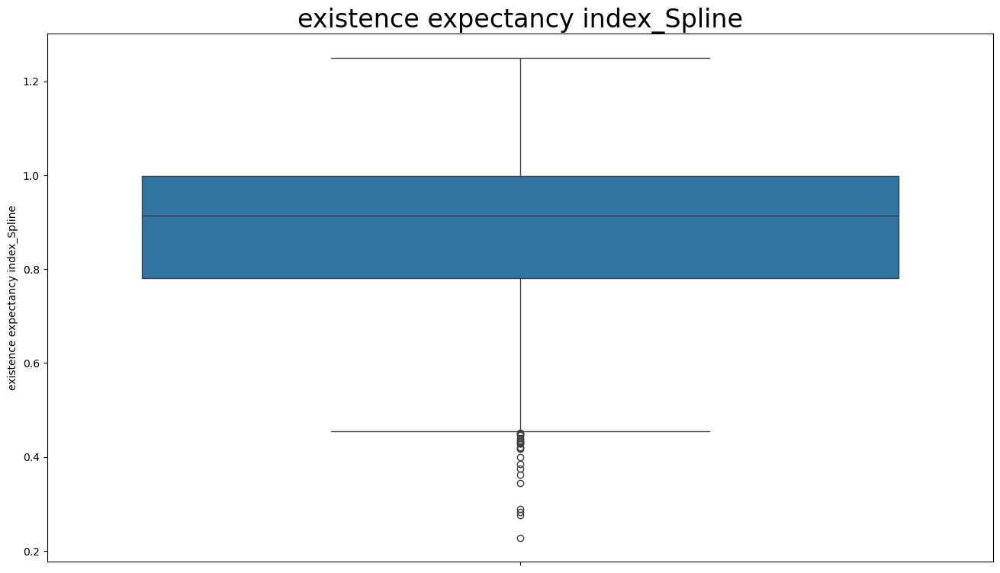

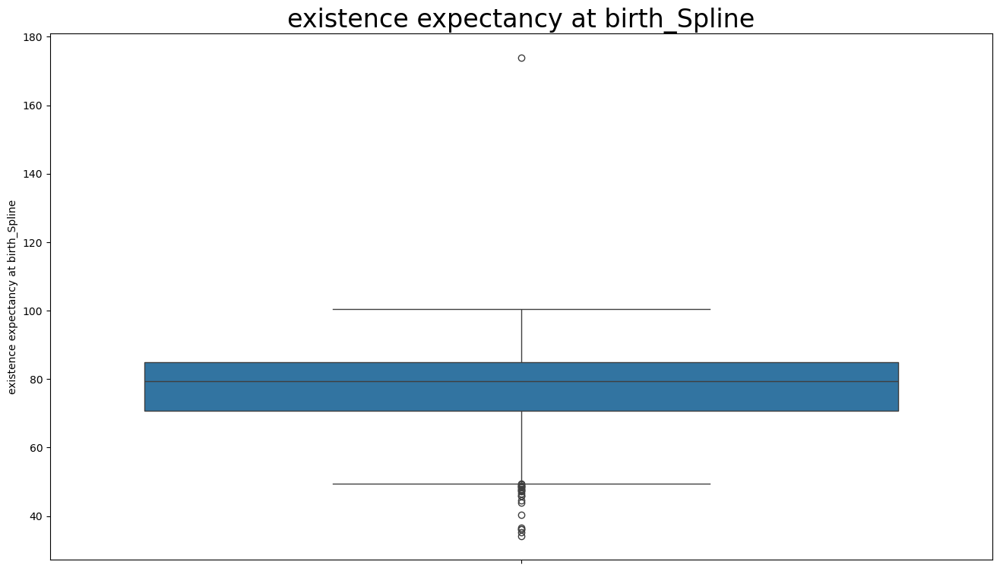

...

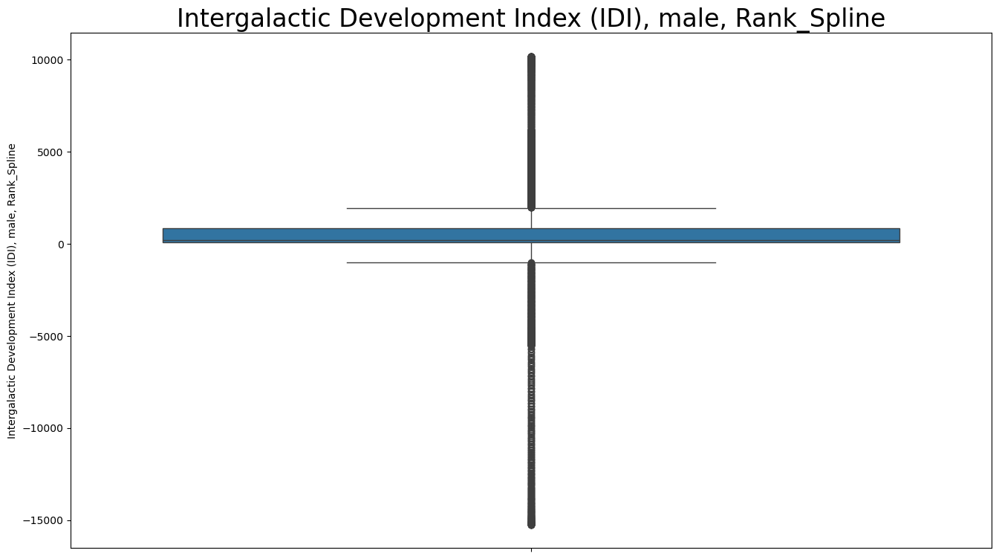

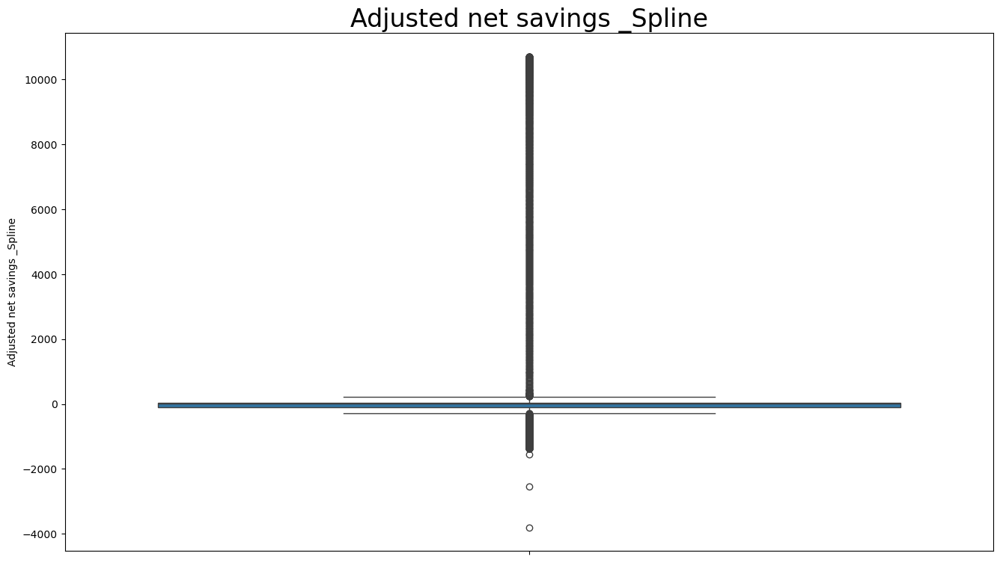

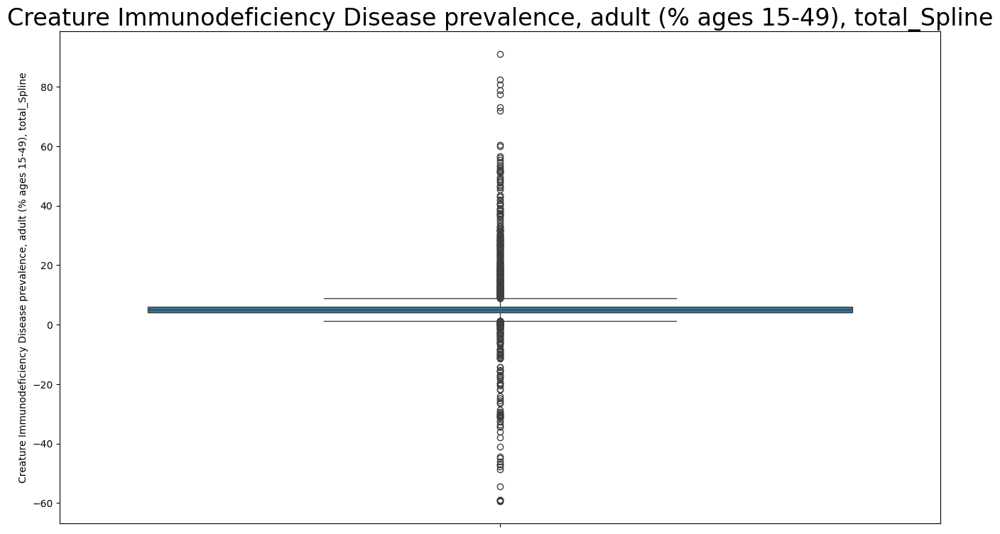

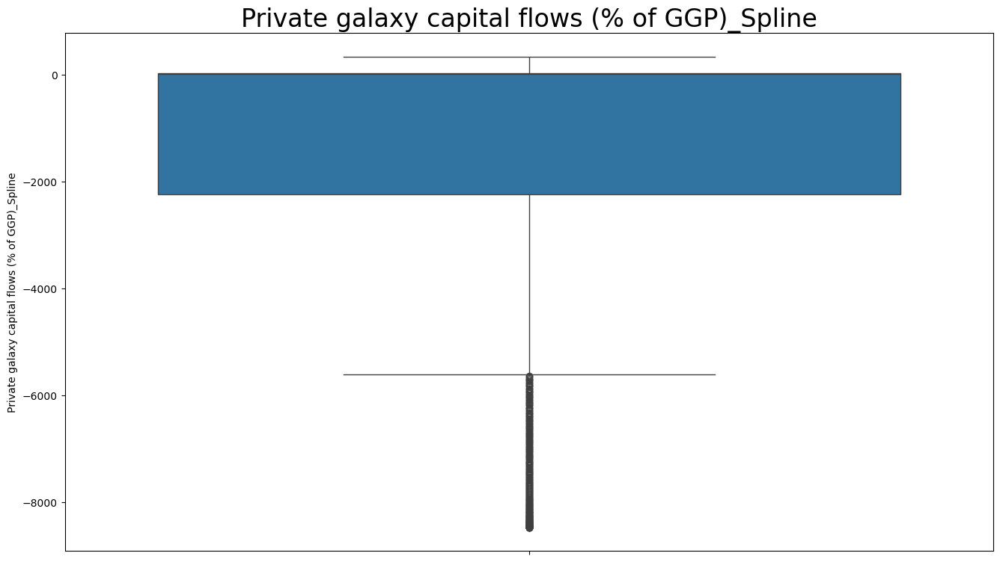

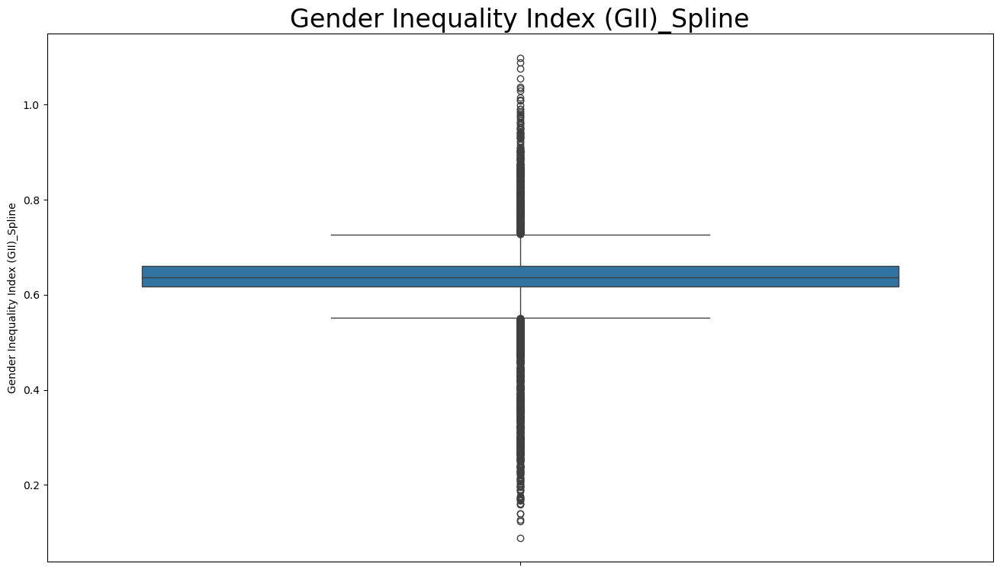

In [89]:
import seaborn as sns
for col in data.columns:
    plt.figure(figsize= (16, 9))
    sns.boxplot(data[col])
    plt.title(col, fontsize= 24)
    plt.show()

In [91]:
# there are  outliers in dataset

In [93]:
columns_ = [col for col in data.columns if col not in ['y','galaxy']]
df1=data[columns_]

In [95]:
# find IQR and bounds , and count how many outliers there are in each column
Q1 = df1.quantile(0.25)
Q3 = df1.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = ((df1 < lower_bound) | (df1 > upper_bound))
outliers_count = outliers.sum()

print(outliers_count)
print(outliers_count.sum())


galactic year_Spline                                                                   0
existence expectancy index_Spline                                                     22
existence expectancy at birth_Spline                                                  22
Gross income per capita_Spline                                                       286
Income Index_Spline                                                                    0
                                                                                    ... 
Intergalactic Development Index (IDI), male, Rank_Spline                            1556
Adjusted net savings _Spline                                                        1159
Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total_Spline     560
Private galaxy capital flows (% of GGP)_Spline                                       219
Gender Inequality Index (GII)_Spline                                                1199
Length: 72, dtype: in

In [97]:
# 17.7% of data are outliers, may be too much to delete or replace, try build model with outliers and look firstly on results, 
# then, if necessary, we will have to deal with them
percentage_outl=60616/df1.size*100
percentage_outl

17.70533940880944

In [99]:
# there is also a problem with data types in column 'galaxy'( which should be  encoded) but first separate data to train test

In [101]:
train = data[:len(train.index)].reset_index()
test = data[len(train.index):].reset_index()

train = train.drop(['index'], axis=1)
test = test.drop(['y','index'], axis=1)

In [103]:
train.shape,test.shape

((3865, 74), (890, 73))

In [105]:
# in column 'galaxy' too much unique values (one hot or label encoder will be irrational to use here), 
# decide to use target encoder, encoded 'galaxy' relatively target 'y' column
import pandas as pd
from category_encoders import TargetEncoder

X = train[['galaxy']]
y = train['y']

encoder = TargetEncoder()
X_encoded = encoder.fit_transform(X['galaxy'], y)

train['galaxy'] = X_encoded
test['galaxy'] = X_encoded


In [107]:
train['galaxy'] # encoder worked

0       0.066141
1       0.068514
2       0.058564
3       0.057792
4       0.164220
          ...   
3860    0.074372
3861    0.070284
3862    0.093759
3863    0.063611
3864    0.106716
Name: galaxy, Length: 3865, dtype: float64

In [109]:
# now check are there any columns need  to be encoded? but it ok, after scaling can start modeling

In [111]:
train.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [113]:
test.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [115]:
y=train['y']
X=train.drop('y',axis=1)

X_train,X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=0)

In [117]:
#Scaling 
scaler=RobustScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [119]:
# Modeling

In [121]:
# linear regression

In [123]:
model_lr = LinearRegression()
model_lr.fit(X_train_scaled, y_train)
y_pred=model_lr.predict(X_test_scaled)

In [125]:
R2=metrics.r2_score(y_test, y_pred)
print ('R^2:', R2)
n=X_test.shape[0] #sample size rows
p=X_test.shape[1] #number of predictors columns
print('Adjusted R^2:' , 1-(1-R2)*(n-1)/(n-p-1))
print('Mean Absolute Error:' , metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:' , metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:' , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R^2: 0.9010449394417313
Adjusted R^2: 0.8943932641003375
Mean Absolute Error: 0.009475872622242094
Mean Squared Error: 0.0004688082781311635
Root Mean Squared Error: 0.021651980928570104


In [127]:
#SVR

In [129]:

model_svr = SVR()
model_svr.fit(X_train_scaled, y_train)
y_pred=model_svr.predict(X_test_scaled)

R2=metrics.r2_score(y_test, y_pred)
print ('R^2:', R2)
n=X_test.shape[0] #sample size rows
p=X_test.shape[1] #number of predictors columns
print('Adjusted R^2:' , 1-(1-R2)*(n-1)/(n-p-1))
print('Mean Absolute Error:' , metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:' , metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:' , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


R^2: 0.01857197232427621
Adjusted R^2: -0.04739878828376054
Mean Absolute Error: 0.060125707099532306
Mean Squared Error: 0.00464960135609632
Root Mean Squared Error: 0.06818798542335973


In [131]:
#XGB regressor

In [133]:
model_xgb = xgboost.XGBRegressor()
model_xgb.fit(X_train_scaled, y_train)
y_pred=model_xgb.predict(X_test_scaled)

R2=metrics.r2_score(y_test, y_pred)
print ('R^2:', R2)
n=X_test.shape[0] #sample size rows
p=X_test.shape[1] #number of predictors columns
print('Adjusted R^2:' , 1-(1-R2)*(n-1)/(n-p-1))
print('Mean Absolute Error:' , metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:' , metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:' , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R^2: 0.9545940784167863
Adjusted R^2: 0.9515419308333843
Mean Absolute Error: 0.004423786652198832
Mean Squared Error: 0.0002151145357730397
Root Mean Squared Error: 0.014666783416040469


In [135]:
# random forest

In [137]:
model_rf = RandomForestRegressor()
model_rf.fit(X_train_scaled, y_train)
y_pred=model_rf.predict(X_test_scaled)

R2=metrics.r2_score(y_test, y_pred)
print ('R^2:', R2)
n=X_test.shape[0] #sample size rows
p=X_test.shape[1] #number of predictors columns
print('Adjusted R^2:' , 1-(1-R2)*(n-1)/(n-p-1))
print('Mean Absolute Error:' , metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:' , metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:' , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R^2: 0.9544605186035328
Adjusted R^2: 0.9513993932426285
Mean Absolute Error: 0.004555466375984627
Mean Squared Error: 0.00021574728710203395
Root Mean Squared Error: 0.014688338473157335


In [139]:
# RF is the best one here=lowest RMSE=0,0145

In [142]:
scaler=RobustScaler()
test_scaled=scaler.fit_transform(test)

In [144]:
pred_y_rf = model_rf.predict(test_scaled)
potential = -np.log(pred_y_rf + 0.01) + 3
num_galaxies = len(test_scaled)
total_energy=50000


In [146]:

df_rf = pd.DataFrame({
    'Index':test.index,
    'ee_index':test['existence expectancy index_Spline'],
    'pred_rf':pred_y_rf,
    'potential_increase':potential,
    'init_energy':0,
    'likely_increase':0,
    'future_energy':0
})

# first find values  an initial amount of energy for each galaxy, according to conditions
low_index_mask = test['existence expectancy index_Spline'] < 0.7
low_index_count = low_index_mask.sum()  # number of galaxies with existence expectancy index < 0.7

high_index_mask = test['existence expectancy index_Spline'] >= 0.7
high_index_count = high_index_mask.sum() # number of galaxies with existence expectancy index >= 0.7

df_rf.loc[df_rf.ee_index < 0.7, 'init_energy'] = np.full(low_index_count, (total_energy*0.1)/low_index_count) 
# equally distribute 10% of all energy between  galaxies with existence expectancy index < 0.7      
df_rf.loc[df_rf.ee_index >= 0.7, 'init_energy'] = np.full(high_index_count, (total_energy-(total_energy*0.1))/high_index_count)
# equally distribute 90% of all energy between  galaxies with existence expectancy index >= 0.7  

#
df_rf['likely_increase'] = (df_rf['init_energy'] * (df_rf['potential_increase'] ** 2)) / 1000

df_rf['future_energy']=df_rf['init_energy']*df_rf['likely_increase'] 
     

In [149]:
round(df_rf,2)

,Index,ee_index,pred_rf,potential_increase,init_energy,likely_increase,future_energy
0,0,0.46,0.05,5.83,75.76,2.57,195.01
1,1,0.53,0.05,5.84,75.76,2.59,196.00
2,2,0.56,0.05,5.86,75.76,2.60,197.02
3,3,0.57,0.05,5.85,75.76,2.59,196.17
4,4,0.59,0.21,4.53,75.76,1.55,117.79
...,...,...,...,...,...,...,...
885,885,0.98,0.20,4.56,54.61,1.14,61.99
886,886,0.98,0.05,5.74,54.61,1.80,98.33
887,887,0.98,0.04,6.08,54.61,2.02,110.41
888,888,0.98,0.03,6.14,54.61,2.06,112.51


In [151]:
(df_rf['init_energy']<1).sum(), (df_rf['init_energy']>100).sum() 
# so condition 'no galaxy should be allocated more than 100 zillion DSML or less than 0 zillion DSML' is met

(0, 0)

In [153]:
(df_rf['likely_increase']<1).value_counts()

likely_increase
False    876
True      14
Name: count, dtype: int64

In [155]:
#  so in 14 galaxies in future there will be descrease of using energy, 'likely increase index'<1

In [157]:
df_rf[df_rf['likely_increase']<1] # here the value of energy decrease

,Index,ee_index,pred_rf,potential_increase,init_energy,likely_increase,future_energy
161,161,0.791021,0.336846,4.058875,54.61165,0.899698,49.133979
163,163,0.791670,0.392807,3.909299,54.61165,0.834609,45.579368
186,186,0.806444,0.396554,3.900038,54.61165,0.830660,45.363687
267,267,0.858998,0.298070,4.177428,54.61165,0.953023,52.046138
346,346,0.905260,0.362624,3.987185,54.61165,0.868197,47.413650
413,413,0.934297,0.297880,4.178045,54.61165,0.953304,52.061528
414,414,0.935049,0.269463,4.274884,54.61165,0.998008,54.502849
474,474,0.959283,0.359335,3.996050,54.61165,0.872062,47.624728
580,580,0.995524,0.299548,4.172641,54.61165,0.950840,51.926929
666,666,1.023461,0.288610,4.208618,54.61165,0.967307,52.826219


In [159]:
df_rf[['Index','pred_rf','init_energy','future_energy']].to_csv('submission_rf.csv', index=False)

In [161]:
df_rf.iloc[0:3]

,Index,ee_index,pred_rf,potential_increase,init_energy,likely_increase,future_energy
0,0,0.456086,0.049067,5.829081,75.757576,2.574105,195.007926
1,1,0.529835,0.048197,5.843921,75.757576,2.587228,196.002138
2,2,0.560976,0.047325,5.859026,75.757576,2.600620,197.016693
